# CPV301 - Lab 4 Note

## Color Models and Color Spaces

This notebook consolidates the tasks from Groups 1-7 in the lab manual. Shared actions such as reading an image, converting color spaces, and plotting channels are implemented once, then reused in the relevant sections so the report has no duplicated questions.

## 1. Introduction and Objectives

This lab studies the difference between color models and color spaces, then uses OpenCV to convert and analyze images in RGB/BGR, HSV/HLS, Lab, Luv, XYZ, YCrCb, YUV, and a simple opponent color representation.

Objectives:

- Explain key color models, color spaces, gamut, luma/chroma, LMS, color constancy, and opponent channels.
- Convert images among common OpenCV color spaces.
- Compare RGB distance with Lab distance for pixels and patches.
- Analyze hue, saturation, lightness, luma, chroma, and opponent channels.
- Implement Gray World white balancing and simple luma/chroma segmentation.

In [1]:
import math
from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import display
from matplotlib.patches import Rectangle

plt.rcParams["figure.figsize"] = (10, 6)
plt.rcParams["axes.grid"] = False

RNG = np.random.default_rng(301)

## 2. Experimental Setup

The lab folder contains only the manual, so this notebook first tries to load existing color images from nearby course folders. If those files are unavailable, it creates deterministic synthetic color scenes. The same code therefore works both in this repository and in a Colab-style environment after image files are uploaded.

Main image source: ../L10_lab2/raw.jpg
Main image shape: (675, 900, 3)
Secondary image source: ../L12_edges_detection/tiger_image.jpg
Secondary image shape: (600, 900, 3)


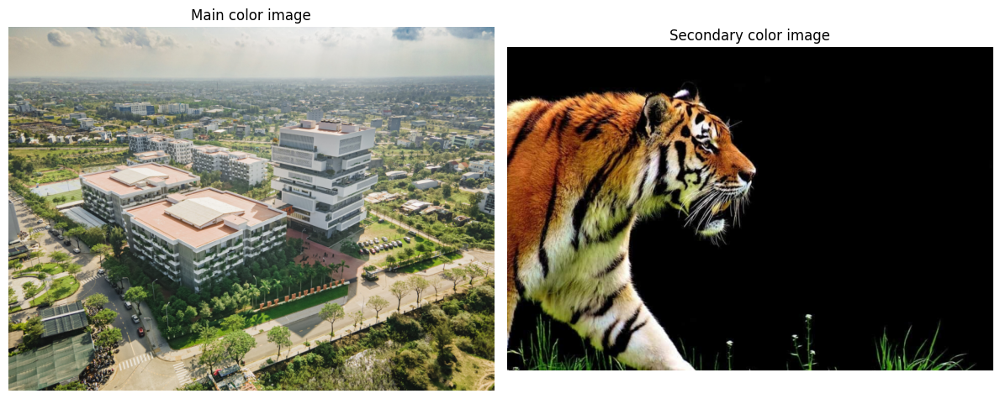

In [2]:
def make_synthetic_scene(width=900, height=600):
    y, x = np.mgrid[0:height, 0:width]
    hue = ((x / max(width - 1, 1)) * 179).astype(np.uint8)
    sat = (70 + (y / max(height - 1, 1)) * 185).astype(np.uint8)
    val = (170 + 60 * np.sin(2 * np.pi * x / max(width, 1))).clip(0, 255).astype(np.uint8)
    hsv = np.dstack([hue, sat, val])
    rgb = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)

    cv2.rectangle(rgb, (50, 55), (285, 245), (225, 35, 40), -1)
    cv2.circle(rgb, (int(width * 0.72), int(height * 0.30)), 95, (30, 185, 80), -1)
    cv2.ellipse(rgb, (int(width * 0.43), int(height * 0.70)), (145, 70), 15, 0, 360, (45, 90, 230), -1)
    cv2.rectangle(rgb, (int(width * 0.62), int(height * 0.62)), (int(width * 0.92), int(height * 0.88)), (245, 210, 35), -1)
    cv2.putText(rgb, "CPV301", (70, height - 65), cv2.FONT_HERSHEY_SIMPLEX, 2.0, (255, 255, 255), 5, cv2.LINE_AA)
    return cv2.cvtColor(rgb, cv2.COLOR_RGB2BGR)


def resize_for_lab(img_bgr, max_width=900):
    h, w = img_bgr.shape[:2]
    if w <= max_width:
        return img_bgr.copy()
    scale = max_width / w
    new_size = (max_width, int(round(h * scale)))
    return cv2.resize(img_bgr, new_size, interpolation=cv2.INTER_AREA)


def colorfulness_score(img_bgr):
    rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB).astype(np.float32)
    return float(np.mean(np.std(rgb.reshape(-1, 3), axis=1)))


def load_image_bank():
    candidate_paths = [
        Path("main/L10_lab2/raw.jpg"),
        Path("../L10_lab2/raw.jpg"),
        Path("main/L12_edges_detection/tiger_image.jpg"),
        Path("../L12_edges_detection/tiger_image.jpg"),
        Path("main/L12_edges_detection/dog_image.jpg"),
        Path("../L12_edges_detection/dog_image.jpg"),
        Path("main/L14_lab3/lab3_data/lab3_stitch_left.jpg"),
        Path("../L14_lab3/lab3_data/lab3_stitch_left.jpg"),
        Path("main/L14_lab3/lab3_data/lab3_stitch_right.jpg"),
        Path("../L14_lab3/lab3_data/lab3_stitch_right.jpg"),
    ]

    image_bank = []
    seen = set()
    for path in candidate_paths:
        if not path.exists():
            continue
        key = str(path.resolve())
        if key in seen:
            continue
        seen.add(key)
        img = cv2.imread(str(path), cv2.IMREAD_COLOR)
        if img is None:
            continue
        img = resize_for_lab(img)
        if colorfulness_score(img) < 3.0:
            continue
        image_bank.append((img, str(path)))
        if len(image_bank) == 2:
            break

    if not image_bank:
        image_bank.append((make_synthetic_scene(), "synthetic color scene"))
    if len(image_bank) == 1:
        image_bank.append((make_synthetic_scene(), "second synthetic color scene"))
    return image_bank


image_bank = load_image_bank()
img_bgr, image_source = image_bank[0]
secondary_bgr, secondary_source = image_bank[1]
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
secondary_rgb = cv2.cvtColor(secondary_bgr, cv2.COLOR_BGR2RGB)

print(f"Main image source: {image_source}")
print(f"Main image shape: {img_bgr.shape}")
print(f"Secondary image source: {secondary_source}")
print(f"Secondary image shape: {secondary_bgr.shape}")

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(img_rgb)
axes[0].set_title("Main color image")
axes[0].axis("off")
axes[1].imshow(secondary_rgb)
axes[1].set_title("Secondary color image")
axes[1].axis("off")
plt.tight_layout()
plt.show()

## 3. Consolidated Theory Answers

### Color models, color spaces, and RGB/sRGB

- A color model is a mathematical way to describe color using components. Examples: RGB, CMYK, HSV, Lab, YUV, opponent channels.
- A color space is a specific, standardized implementation of a model with a defined gamut, white point, transfer curve, and numeric interpretation. Examples: sRGB, Adobe RGB, CIE XYZ, CIE Lab.
- RGB as a model says that color is represented by red, green, and blue components. sRGB is a specific RGB color space with defined primaries, D65 white point, gamma-like transfer function, and a limited display-oriented gamut.
- HSV/HLS can be more convenient than RGB for thresholding because hue separates color type from brightness. In RGB, changing illumination changes all three channels at once, making simple thresholds less intuitive.

### Additive/subtractive color and YCrCb

- RGB is an additive model: red, green, and blue light are added together. It is used by cameras, displays, and projectors.
- CMYK is a subtractive model: cyan, magenta, yellow, and black inks absorb light from paper. It is used in printing.
- In YCrCb, Y is luma or brightness information, Cr is red-difference chroma, and Cb is blue-difference chroma.
- Lab is often better than RGB for color difference, color correction, and perceptual analysis because Lab was designed to be more perceptually uniform.

### CIE XYZ, Lab, Luv, and Delta E

- CIE XYZ is a device-independent reference space based on human color matching experiments. Many other color spaces are defined through transformations from XYZ.
- CIE Lab and CIE Luv both separate lightness from chromatic components and are intended to be more perceptually uniform than RGB.
- Lab is common in image editing, color difference, and print workflows. Luv is often useful for additive-light contexts and chromaticity-based analysis.
- Delta E CIE76 is the Euclidean distance between two colors in Lab. A larger value indicates a larger perceived color difference, although newer Delta E formulas improve on CIE76.

### Gamut and common RGB spaces

- A gamut is the range of colors that a color space, device, or process can represent.
- sRGB has a smaller gamut and is the default for web, consumer displays, and general image exchange.
- Adobe RGB has a wider gamut, especially in green/cyan regions, and is used in photography and print workflows where saturated colors matter.
- Understanding gamut is important because colors outside a target gamut must be clipped or mapped, which can change the appearance of images across cameras, monitors, and printers.

### Opponent color spaces and the human visual system

- Opponent color spaces represent colors as opposing axes such as red-green, yellow-blue, and light-dark.
- This matches part of human vision: cone responses are combined by later visual processing into opponent signals rather than being used only as raw L, M, and S cone outputs.
- Color segmentation, vegetation detection, color constancy, and saliency analysis can benefit from opponent channels because they isolate meaningful color contrasts.

### LMS and color constancy

- LMS models the responses of the three cone classes in the human retina: long-, medium-, and short-wavelength cones.
- Color constancy is the ability to perceive object colors as relatively stable under different lighting. In computer vision, it helps reduce color shifts caused by illumination changes.
- The Gray World method assumes the average scene color should be neutral gray. It scales RGB channels so their means become equal.

### YUV, YCbCr, chroma subsampling, and luma/chroma processing

- YUV was developed for analog television. YCbCr is the digital luma/chroma representation used in JPEG, MPEG, and many video systems.
- Chroma channels are often subsampled because human vision is more sensitive to luma detail than chroma detail. This reduces data size with limited perceived quality loss.
- Separating luma and chroma helps tasks such as brightness segmentation, skin-color detection, shadow handling, and video compression.

## 4. Shared Color Space Conversions

This section covers the repeated practical requirement to read a BGR image with OpenCV and convert it to RGB, HSV, HLS, Lab, YCrCb, XYZ, Luv, and YUV.

In [3]:
hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
hls = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HLS)
lab_u8 = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2Lab)
ycrcb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2YCrCb)
xyz = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2XYZ)
luv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2Luv)
yuv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2YUV)
gray_cv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

conversion_summary = []
for name, arr in [
    ("BGR", img_bgr),
    ("RGB", img_rgb),
    ("HSV", hsv),
    ("HLS", hls),
    ("Lab", lab_u8),
    ("YCrCb", ycrcb),
    ("XYZ", xyz),
    ("Luv", luv),
    ("YUV", yuv),
]:
    conversion_summary.append({
        "space": name,
        "shape": arr.shape,
        "dtype": str(arr.dtype),
        "min": int(arr.min()),
        "max": int(arr.max()),
    })

display(pd.DataFrame(conversion_summary))

,space,shape,dtype,min,max
0,BGR,"(675, 900, 3)",uint8,2,253
1,RGB,"(675, 900, 3)",uint8,2,253
2,HSV,"(675, 900, 3)",uint8,0,253
3,HLS,"(675, 900, 3)",uint8,0,253
4,Lab,"(675, 900, 3)",uint8,9,253
5,YCrCb,"(675, 900, 3)",uint8,13,252
6,XYZ,"(675, 900, 3)",uint8,9,255
7,Luv,"(675, 900, 3)",uint8,9,252
8,YUV,"(675, 900, 3)",uint8,13,252


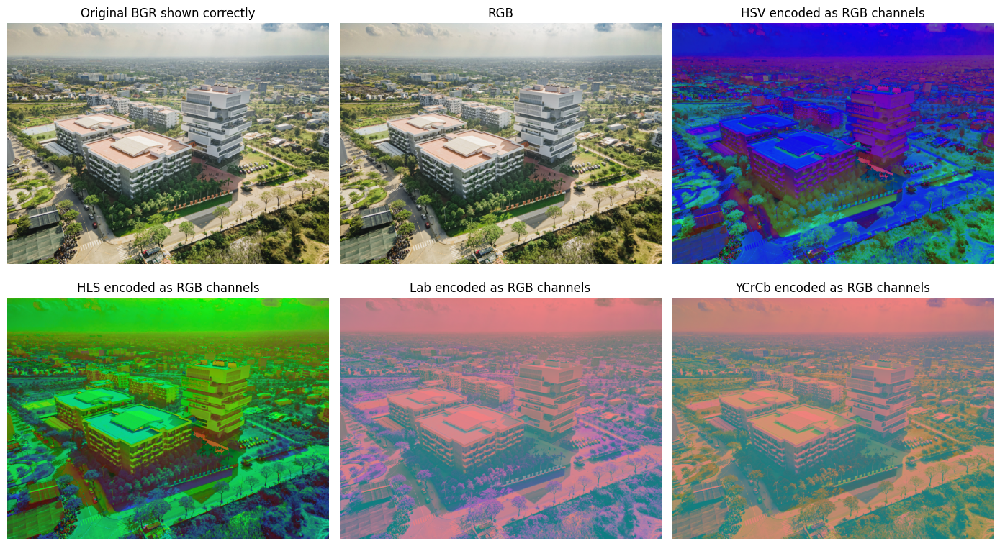

In [4]:
fig, axes = plt.subplots(2, 3, figsize=(14, 8))
display_items = [
    ("Original BGR shown correctly", cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)),
    ("RGB", img_rgb),
    ("HSV encoded as RGB channels", hsv),
    ("HLS encoded as RGB channels", hls),
    ("Lab encoded as RGB channels", lab_u8),
    ("YCrCb encoded as RGB channels", ycrcb),
]

for ax, (title, arr) in zip(axes.ravel(), display_items):
    ax.imshow(arr)
    ax.set_title(title)
    ax.axis("off")

plt.tight_layout()
plt.show()

The original BGR image is converted to RGB before display so matplotlib shows correct colors. The HSV, HLS, Lab, and YCrCb images above are displayed as encoded three-channel arrays, so their unusual colors show how the numeric channels differ from RGB rather than how the original scene should look.

## 5. HSV Hue and Lab Lightness Histograms

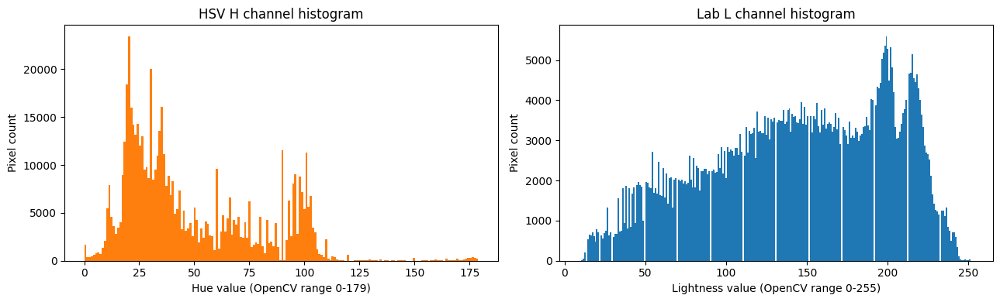

In [5]:
fig, axes = plt.subplots(1, 2, figsize=(13, 4))

axes[0].hist(hsv[:, :, 0].ravel(), bins=180, color="tab:orange")
axes[0].set_title("HSV H channel histogram")
axes[0].set_xlabel("Hue value (OpenCV range 0-179)")
axes[0].set_ylabel("Pixel count")

axes[1].hist(lab_u8[:, :, 0].ravel(), bins=256, color="tab:blue")
axes[1].set_title("Lab L channel histogram")
axes[1].set_xlabel("Lightness value (OpenCV range 0-255)")
axes[1].set_ylabel("Pixel count")

plt.tight_layout()
plt.show()

The Lab L channel is more suitable for brightness or lightness analysis because it was designed as a perceptual lightness axis. HSV H describes hue angle, not brightness. HSV V can be useful for simple brightness work, but it is based on the maximum RGB channel and is less perceptually meaningful than Lab L.

## 6. Pixel and Patch Color Distances

The lab asks for RGB and Lab Euclidean distances between selected pixels and patches. To avoid depending on a specific image layout, the code below selects visibly diverse sample points from the loaded image using farthest-point sampling in Lab space.

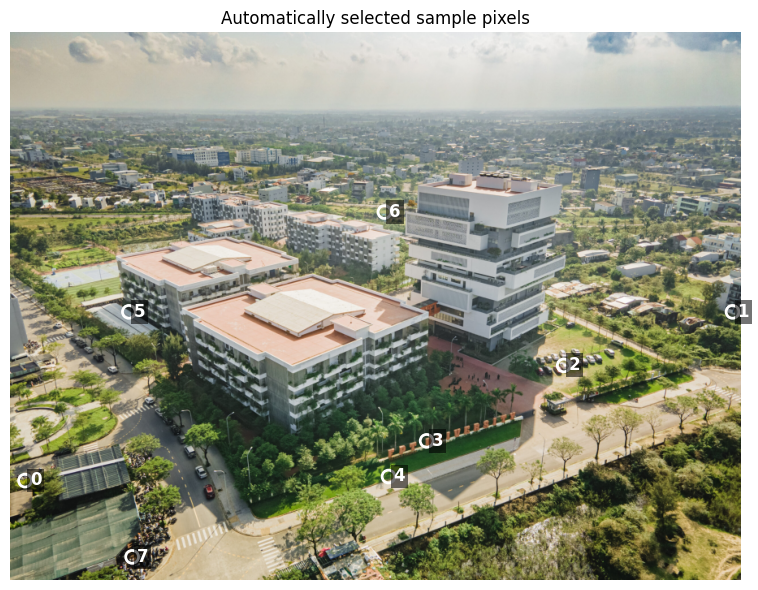

,point,y,x,R,G,B
0,0,552,18,165,174,9
1,1,344,890,27,44,63
2,2,410,682,252,252,253
3,3,503,513,175,113,80
4,4,547,466,51,97,39
5,5,344,146,124,142,146
6,6,221,461,192,194,132
7,7,646,150,75,53,32


In [6]:
def rgb_uint8_to_lab_float(rgb_values):
    arr = np.asarray(rgb_values, dtype=np.float32).reshape(-1, 1, 3) / 255.0
    return cv2.cvtColor(arr, cv2.COLOR_RGB2Lab).reshape(-1, 3)


def select_diverse_points(img_rgb, n=8, max_samples=7000):
    h, w = img_rgb.shape[:2]
    flat = img_rgb.reshape(-1, 3)
    total = len(flat)
    sample_count = min(max_samples, total)
    indices = RNG.choice(total, sample_count, replace=False) if total > sample_count else np.arange(total)
    colors = flat[indices]

    hsv_sample = cv2.cvtColor(colors.reshape(-1, 1, 3), cv2.COLOR_RGB2HSV).reshape(-1, 3)
    lab_sample = rgb_uint8_to_lab_float(colors)

    first = int(np.argmax(0.7 * hsv_sample[:, 1].astype(float) + 0.3 * hsv_sample[:, 2].astype(float)))
    selected = [first]
    min_dist = np.full(sample_count, np.inf)

    while len(selected) < n:
        dist = np.linalg.norm(lab_sample - lab_sample[selected[-1]], axis=1)
        min_dist = np.minimum(min_dist, dist)
        min_dist[selected] = -1
        selected.append(int(np.argmax(min_dist)))

    points = []
    for selected_index in selected:
        flat_index = int(indices[selected_index])
        y, x = divmod(flat_index, w)
        points.append((int(y), int(x)))
    return points


def plot_points(img_rgb, points, title):
    fig, ax = plt.subplots(figsize=(9, 6))
    ax.imshow(img_rgb)
    for i, (y, x) in enumerate(points):
        ax.scatter([x], [y], s=85, facecolors="none", edgecolors="white", linewidths=2)
        ax.text(x + 6, y + 6, str(i), color="white", fontsize=12, weight="bold",
                bbox=dict(facecolor="black", alpha=0.55, edgecolor="none", pad=2))
    ax.set_title(title)
    ax.axis("off")
    plt.tight_layout()
    plt.show()


sample_points = select_diverse_points(img_rgb, n=8)
plot_points(img_rgb, sample_points, "Automatically selected sample pixels")

point_table = []
for idx, (y, x) in enumerate(sample_points):
    point_table.append({
        "point": idx,
        "y": y,
        "x": x,
        "R": int(img_rgb[y, x, 0]),
        "G": int(img_rgb[y, x, 1]),
        "B": int(img_rgb[y, x, 2]),
    })
display(pd.DataFrame(point_table))

In [7]:
def pixel_distance_row(pair_index, p1, p2):
    y1, x1 = p1
    y2, x2 = p2
    rgb1 = img_rgb[y1, x1].astype(np.float32)
    rgb2 = img_rgb[y2, x2].astype(np.float32)
    lab1, lab2 = rgb_uint8_to_lab_float([rgb1, rgb2])
    rgb_dist = float(np.linalg.norm(rgb1 - rgb2))
    lab_dist = float(np.linalg.norm(lab1 - lab2))
    if lab_dist < 12:
        perception = "very similar"
    elif lab_dist < 30:
        perception = "moderately different"
    elif lab_dist < 60:
        perception = "clearly different"
    else:
        perception = "very different"
    return {
        "pair": pair_index,
        "p1(y,x)": p1,
        "p2(y,x)": p2,
        "RGB distance": round(rgb_dist, 2),
        "Lab distance": round(lab_dist, 2),
        "subjective perception": perception,
    }


two_pixel_result = pixel_distance_row(1, sample_points[0], sample_points[1])
display(pd.DataFrame([two_pixel_result]))

,pair,"p1(y,x)","p2(y,x)",RGB distance,Lab distance,subjective perception
0,1,"(552, 18)","(344, 890)",197.13,99.28,very different


For clearly different colors, RGB distance measures raw device-channel separation, while Lab distance is usually more consistent with perceived color difference. Lab is still an approximation here, but it better matches the idea that a small numeric RGB change can be very visible in one region and less visible in another.

In [8]:
pairs = [
    (sample_points[0], sample_points[1]),
    (sample_points[0], sample_points[2]),
    (sample_points[1], sample_points[3]),
    (sample_points[2], sample_points[4]),
    (sample_points[3], sample_points[5]),
]

pair_rows = [pixel_distance_row(i + 1, p1, p2) for i, (p1, p2) in enumerate(pairs)]
display(pd.DataFrame(pair_rows))

,pair,"p1(y,x)","p2(y,x)",RGB distance,Lab distance,subjective perception
0,1,"(552, 18)","(344, 890)",197.13,99.28,very different
1,2,"(552, 18)","(410, 682)",270.53,78.49,very different
2,3,"(344, 890)","(503, 513)",164.18,59.67,clearly different
3,4,"(410, 682)","(547, 466)",332.00,73.92,very different
4,5,"(503, 513)","(344, 146)",88.31,42.46,clearly different


The table above covers the five sample-pixel pairs requested for the XYZ/Lab/Luv group section. Lab distance tends to align better when the visual difference is mostly hue or saturation rather than only a raw increase in one RGB channel.

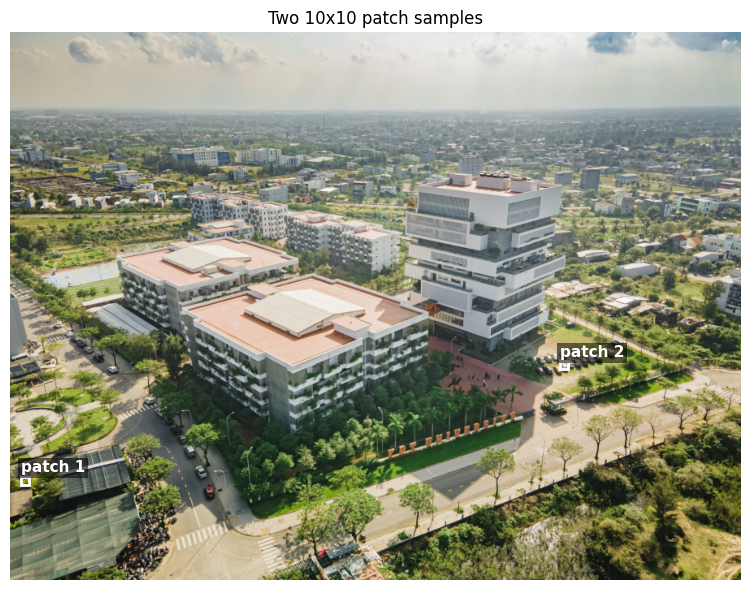

,patch,mean R,mean G,mean B,mean L,mean a,mean b
0,1,131.02,131.79,52.55,53.44,-11.20,41.66
1,2,185.90,175.98,157.69,72.12,0.42,10.72


Patch RGB distance: 126.57
Patch Lab distance: 37.96


In [9]:
def patch_bounds(center, half_size, shape):
    y, x = center
    h, w = shape[:2]
    y0 = max(0, y - half_size)
    y1 = min(h, y + half_size)
    x0 = max(0, x - half_size)
    x1 = min(w, x + half_size)
    return y0, y1, x0, x1


patch_centers = [sample_points[0], sample_points[2]]
half_size = 5
patch_means = []

fig, ax = plt.subplots(figsize=(9, 6))
ax.imshow(img_rgb)
for i, center in enumerate(patch_centers):
    y0, y1, x0, x1 = patch_bounds(center, half_size, img_rgb.shape)
    patch = img_rgb[y0:y1, x0:x1]
    mean_rgb = patch.reshape(-1, 3).mean(axis=0)
    mean_lab = rgb_uint8_to_lab_float([mean_rgb])[0]
    patch_means.append((mean_rgb, mean_lab))
    ax.add_patch(Rectangle((x0, y0), x1 - x0, y1 - y0, fill=False, edgecolor="white", linewidth=2))
    ax.text(x0, y0 - 5, f"patch {i + 1}", color="white", fontsize=11, weight="bold",
            bbox=dict(facecolor="black", alpha=0.55, edgecolor="none", pad=2))
ax.set_title("Two 10x10 patch samples")
ax.axis("off")
plt.tight_layout()
plt.show()

rgb_patch_dist = float(np.linalg.norm(patch_means[0][0] - patch_means[1][0]))
lab_patch_dist = float(np.linalg.norm(patch_means[0][1] - patch_means[1][1]))

patch_table = pd.DataFrame([
    {
        "patch": 1,
        "mean R": round(float(patch_means[0][0][0]), 2),
        "mean G": round(float(patch_means[0][0][1]), 2),
        "mean B": round(float(patch_means[0][0][2]), 2),
        "mean L": round(float(patch_means[0][1][0]), 2),
        "mean a": round(float(patch_means[0][1][1]), 2),
        "mean b": round(float(patch_means[0][1][2]), 2),
    },
    {
        "patch": 2,
        "mean R": round(float(patch_means[1][0][0]), 2),
        "mean G": round(float(patch_means[1][0][1]), 2),
        "mean B": round(float(patch_means[1][0][2]), 2),
        "mean L": round(float(patch_means[1][1][0]), 2),
        "mean a": round(float(patch_means[1][1][1]), 2),
        "mean b": round(float(patch_means[1][1][2]), 2),
    },
])
display(patch_table)
print(f"Patch RGB distance: {rgb_patch_dist:.2f}")
print(f"Patch Lab distance: {lab_patch_dist:.2f}")

Patch averages reduce single-pixel noise. The Lab patch distance is generally the better perceptual comparison because it compares lightness and chromatic differences in a more human-oriented coordinate system.

## 7. YCrCb Channels and Grayscale Comparison

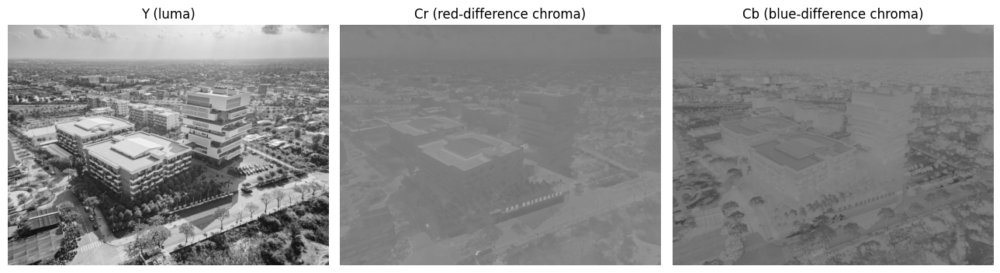

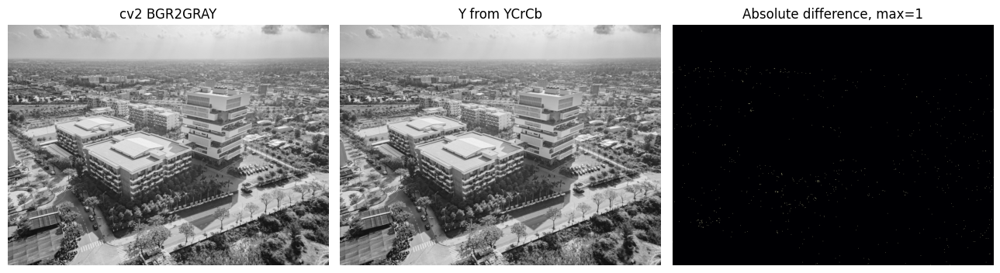

In [10]:
channel_names = ["Y (luma)", "Cr (red-difference chroma)", "Cb (blue-difference chroma)"]
fig, axes = plt.subplots(1, 3, figsize=(13, 4))
for ax, channel, name in zip(axes, cv2.split(ycrcb), channel_names):
    ax.imshow(channel, cmap="gray", vmin=0, vmax=255)
    ax.set_title(name)
    ax.axis("off")
plt.tight_layout()
plt.show()

y_channel = ycrcb[:, :, 0]
diff = cv2.absdiff(gray_cv, y_channel)

fig, axes = plt.subplots(1, 3, figsize=(13, 4))
axes[0].imshow(gray_cv, cmap="gray", vmin=0, vmax=255)
axes[0].set_title("cv2 BGR2GRAY")
axes[1].imshow(y_channel, cmap="gray", vmin=0, vmax=255)
axes[1].set_title("Y from YCrCb")
axes[2].imshow(diff, cmap="magma")
axes[2].set_title(f"Absolute difference, max={int(diff.max())}")
for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()

The Y channel is the most similar to a grayscale intensity image because it stores luma. In OpenCV, BGR2GRAY and the Y channel from YCrCb are based on similar luma weights, so they are usually identical or nearly identical except for rounding.

## 8. XYZ, Lab, and Luv Conversions

CIE XYZ acts as a reference color space. Lab and Luv are derived from CIE concepts and are more useful than raw RGB for perceptual comparisons.

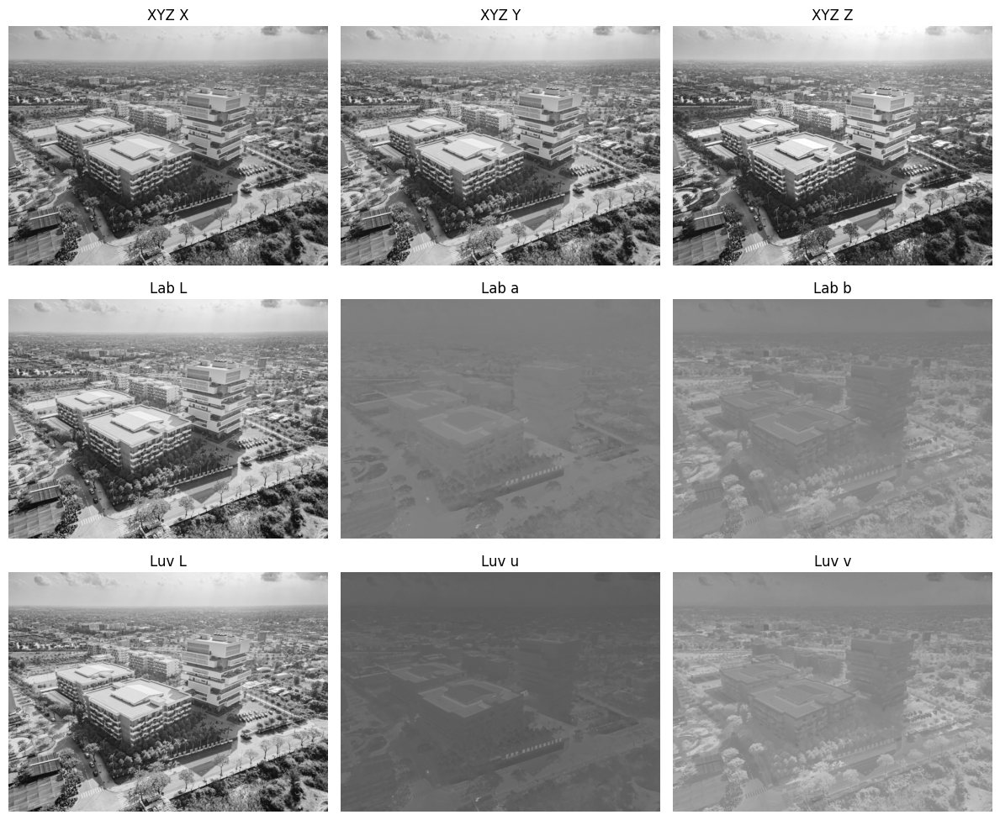

In [11]:
fig, axes = plt.subplots(3, 3, figsize=(12, 10))
space_channels = [
    ("XYZ", xyz, ["X", "Y", "Z"]),
    ("Lab", lab_u8, ["L", "a", "b"]),
    ("Luv", luv, ["L", "u", "v"]),
]
for row, (space_name, arr, names) in enumerate(space_channels):
    for col, channel_name in enumerate(names):
        axes[row, col].imshow(arr[:, :, col], cmap="gray", vmin=0, vmax=255)
        axes[row, col].set_title(f"{space_name} {channel_name}")
        axes[row, col].axis("off")
plt.tight_layout()
plt.show()

Lab and Luv both separate lightness from color-opponent dimensions. The channel displays show why this separation is useful: the L-like channels track structure and brightness, while the other channels emphasize chromatic variation.

## 9. HSV Scatter Plot, Hue-Saturation Grid, and Gamut Diagram

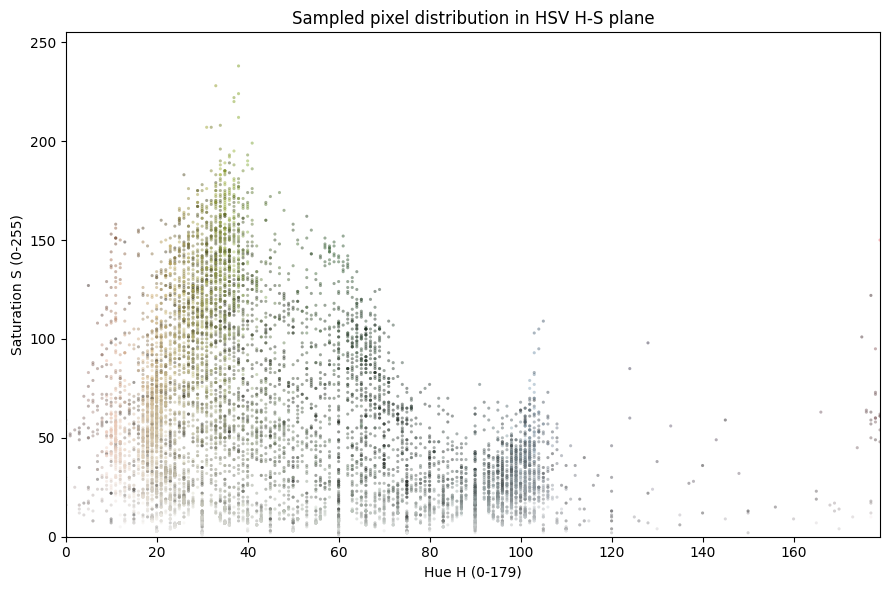

In [12]:
flat_hsv = hsv.reshape(-1, 3)
flat_rgb = img_rgb.reshape(-1, 3)
sample_count = min(9000, len(flat_hsv))
sample_idx = RNG.choice(len(flat_hsv), sample_count, replace=False)

fig, ax = plt.subplots(figsize=(9, 6))
ax.scatter(
    flat_hsv[sample_idx, 0],
    flat_hsv[sample_idx, 1],
    c=flat_rgb[sample_idx] / 255.0,
    s=5,
    alpha=0.45,
    linewidths=0,
)
ax.set_title("Sampled pixel distribution in HSV H-S plane")
ax.set_xlabel("Hue H (0-179)")
ax.set_ylabel("Saturation S (0-255)")
ax.set_xlim(0, 179)
ax.set_ylim(0, 255)
plt.tight_layout()
plt.show()

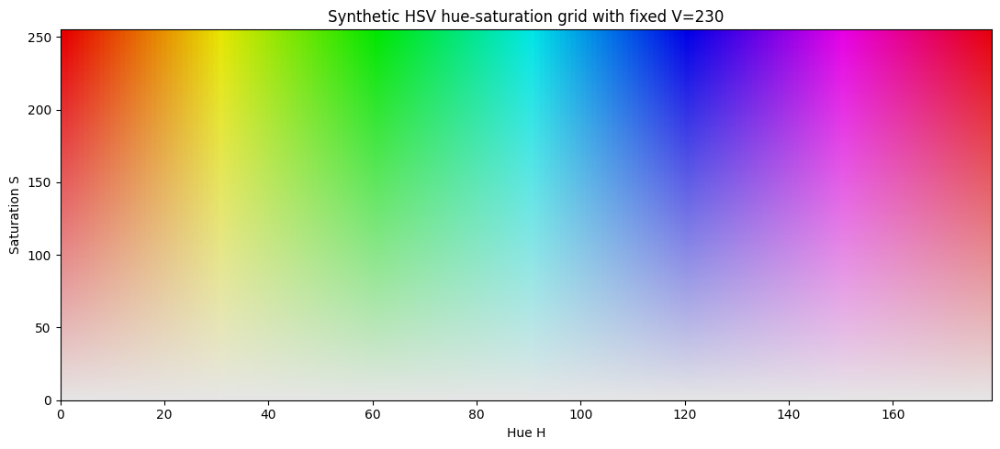

In [13]:
grid_h = np.tile(np.linspace(0, 179, 360, dtype=np.uint8), (256, 1))
grid_s = np.tile(np.linspace(0, 255, 256, dtype=np.uint8).reshape(-1, 1), (1, 360))
grid_v = np.full_like(grid_h, 230, dtype=np.uint8)
grid_hsv = np.dstack([grid_h, grid_s, grid_v])
grid_rgb = cv2.cvtColor(grid_hsv, cv2.COLOR_HSV2RGB)

plt.figure(figsize=(11, 5))
plt.imshow(grid_rgb, origin="lower", extent=[0, 179, 0, 255], aspect="auto")
plt.title("Synthetic HSV hue-saturation grid with fixed V=230")
plt.xlabel("Hue H")
plt.ylabel("Saturation S")
plt.tight_layout()
plt.show()

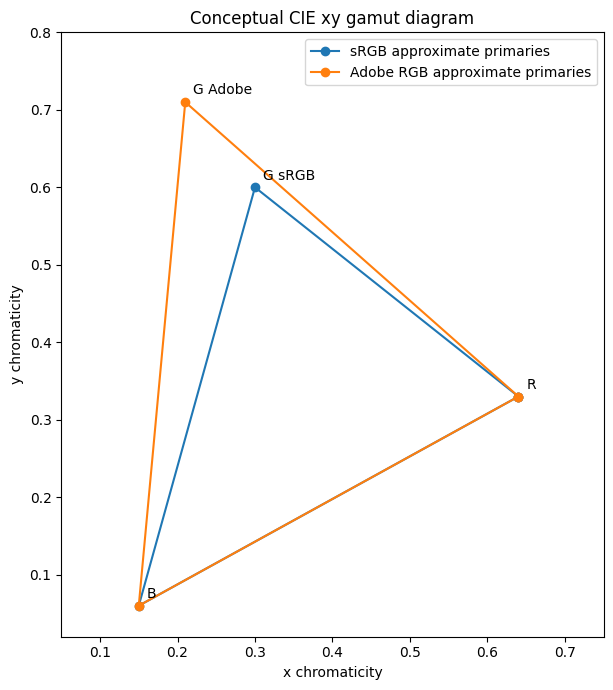

In [14]:
srgb_xy = np.array([
    [0.640, 0.330],
    [0.300, 0.600],
    [0.150, 0.060],
    [0.640, 0.330],
])
adobe_rgb_xy = np.array([
    [0.640, 0.330],
    [0.210, 0.710],
    [0.150, 0.060],
    [0.640, 0.330],
])

fig, ax = plt.subplots(figsize=(7, 7))
ax.plot(srgb_xy[:, 0], srgb_xy[:, 1], marker="o", label="sRGB approximate primaries")
ax.plot(adobe_rgb_xy[:, 0], adobe_rgb_xy[:, 1], marker="o", label="Adobe RGB approximate primaries")
for label, xy in [
    ("R", srgb_xy[0]),
    ("G sRGB", srgb_xy[1]),
    ("G Adobe", adobe_rgb_xy[1]),
    ("B", srgb_xy[2]),
]:
    ax.text(xy[0] + 0.01, xy[1] + 0.01, label)
ax.set_title("Conceptual CIE xy gamut diagram")
ax.set_xlabel("x chromaticity")
ax.set_ylabel("y chromaticity")
ax.set_xlim(0.05, 0.75)
ax.set_ylim(0.02, 0.80)
ax.set_aspect("equal", adjustable="box")
ax.legend()
plt.tight_layout()
plt.show()

The H-S scatter plot shows which hue and saturation combinations actually appear in the selected image. The synthetic H-S grid shows the full HSV coordinate range at a fixed value. The gamut diagram explains why a color coordinate system does not guarantee every displayed color is reproducible in every RGB space: Adobe RGB covers more green/cyan chromaticity than sRGB, while the input image is assumed to be sRGB and is therefore limited by the sRGB triangle.

## 10. Simple Opponent Color Transform

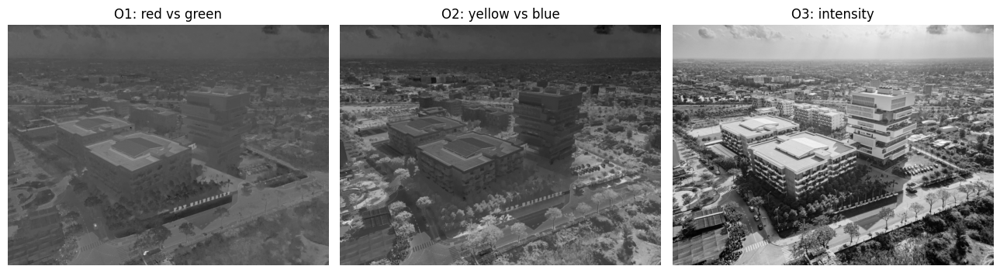

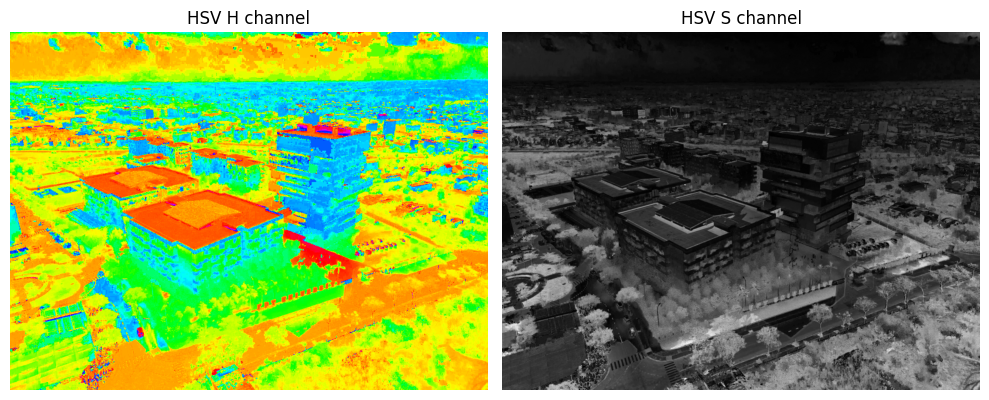

In [15]:
rgb_float = img_rgb.astype(np.float32)
R = rgb_float[:, :, 0]
G = rgb_float[:, :, 1]
B = rgb_float[:, :, 2]

O1 = (R - G) / math.sqrt(2)
O2 = (R + G - 2 * B) / math.sqrt(6)
O3 = (R + G + B) / math.sqrt(3)


def normalize_to_u8(channel):
    return cv2.normalize(channel, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)


opponent_channels = [
    ("O1: red vs green", normalize_to_u8(O1)),
    ("O2: yellow vs blue", normalize_to_u8(O2)),
    ("O3: intensity", normalize_to_u8(O3)),
]

fig, axes = plt.subplots(1, 3, figsize=(13, 4))
for ax, (title, channel) in zip(axes, opponent_channels):
    ax.imshow(channel, cmap="gray", vmin=0, vmax=255)
    ax.set_title(title)
    ax.axis("off")
plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes[0].imshow(hsv[:, :, 0], cmap="hsv", vmin=0, vmax=179)
axes[0].set_title("HSV H channel")
axes[1].imshow(hsv[:, :, 1], cmap="gray", vmin=0, vmax=255)
axes[1].set_title("HSV S channel")
for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()

O1 best separates red and green regions because it directly subtracts G from R. O3 best captures overall intensity because it averages the three RGB components. HSV H is strong for separating hue categories, while HSV S shows color purity. Opponent channels are often easier to interpret for biologically motivated red-green or yellow-blue contrasts.

## 11. Gray World White Balancing and Color Constancy

The manual asks for 2-3 images of the same scene under different lighting. Because the lab folder has no such dataset, this notebook creates three controlled lighting variants from the same image. This keeps the scene constant and makes the color-constancy comparison reproducible.

,variant,mean R before,mean G before,mean B before,gain R,gain G,gain B
0,warm light,176.02,149.90,92.24,0.792,0.930,1.511
1,cool light,102.92,131.63,144.98,1.229,0.961,0.873
2,dim green light,87.59,141.95,79.28,1.175,0.725,1.298


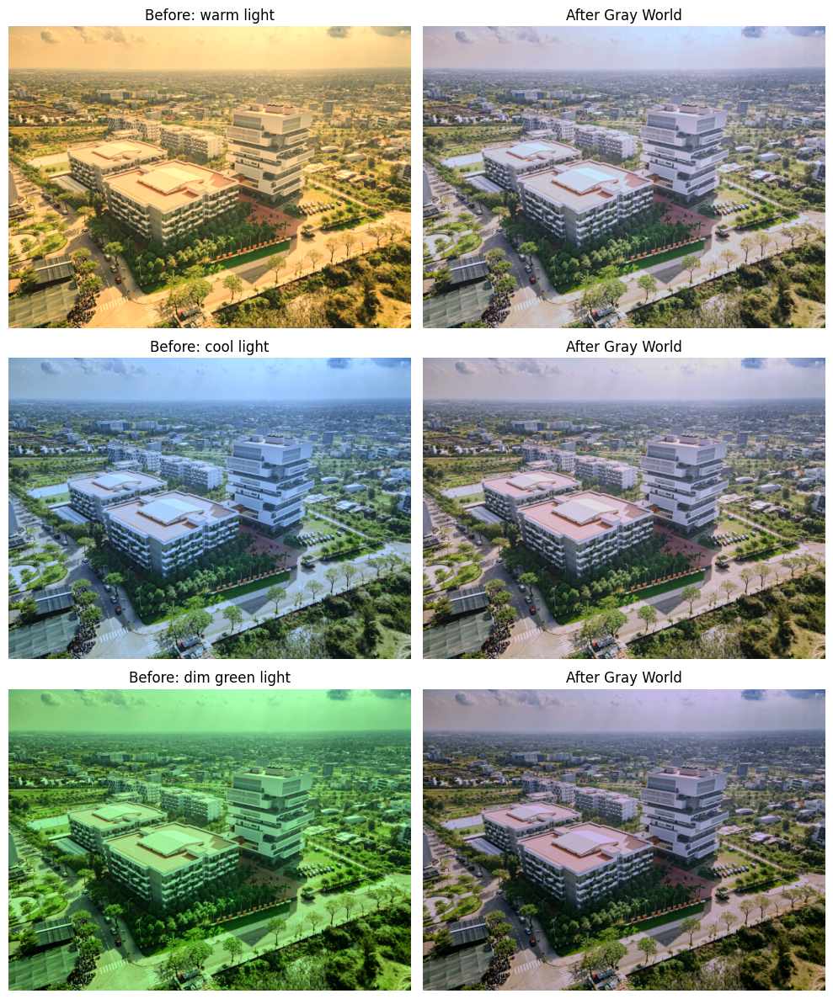

In [16]:
def apply_lighting(rgb, gains, gamma=1.0, brightness=0.0):
    arr = rgb.astype(np.float32) / 255.0
    arr = np.power(arr, gamma)
    arr = arr * np.array(gains, dtype=np.float32).reshape(1, 1, 3)
    arr = arr * 255.0 + brightness
    return np.clip(arr, 0, 255).astype(np.uint8)


def gray_world_white_balance(rgb):
    arr = rgb.astype(np.float32)
    means = arr.reshape(-1, 3).mean(axis=0)
    target = means.mean()
    gains = target / (means + 1e-6)
    balanced = np.clip(arr * gains.reshape(1, 1, 3), 0, 255).astype(np.uint8)
    return balanced, means, gains


lighting_variants = [
    ("warm light", apply_lighting(img_rgb, gains=(1.25, 1.02, 0.72), gamma=0.95, brightness=4)),
    ("cool light", apply_lighting(img_rgb, gains=(0.76, 0.96, 1.25), gamma=1.03, brightness=0)),
    ("dim green light", apply_lighting(img_rgb, gains=(0.76, 1.18, 0.82), gamma=1.18, brightness=-8)),
]

balance_rows = []
balanced_variants = []
for name, variant in lighting_variants:
    balanced, means, gains = gray_world_white_balance(variant)
    balanced_variants.append((name, balanced))
    balance_rows.append({
        "variant": name,
        "mean R before": round(float(means[0]), 2),
        "mean G before": round(float(means[1]), 2),
        "mean B before": round(float(means[2]), 2),
        "gain R": round(float(gains[0]), 3),
        "gain G": round(float(gains[1]), 3),
        "gain B": round(float(gains[2]), 3),
    })

display(pd.DataFrame(balance_rows))

fig, axes = plt.subplots(len(lighting_variants), 2, figsize=(10, 12))
for row, ((name, before), (_, after)) in enumerate(zip(lighting_variants, balanced_variants)):
    axes[row, 0].imshow(before)
    axes[row, 0].set_title(f"Before: {name}")
    axes[row, 1].imshow(after)
    axes[row, 1].set_title("After Gray World")
    axes[row, 0].axis("off")
    axes[row, 1].axis("off")
plt.tight_layout()
plt.show()

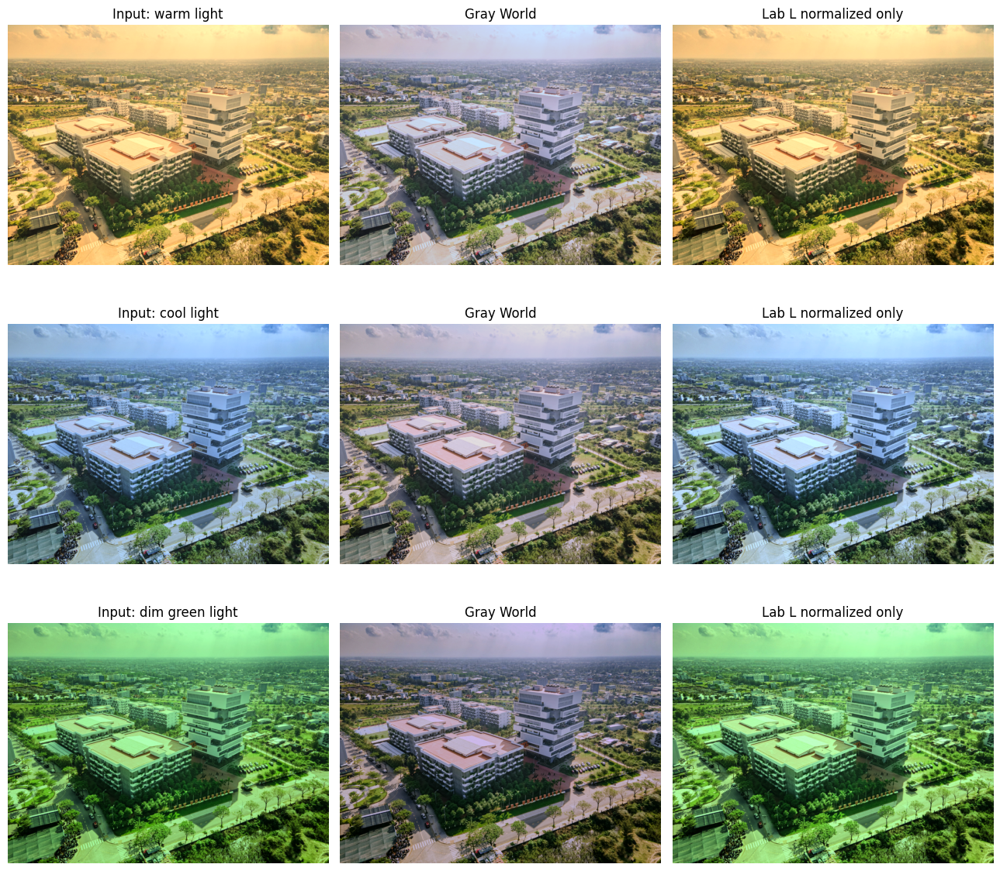

In [17]:
def lab_l_channel_normalize(rgb):
    lab = cv2.cvtColor(rgb, cv2.COLOR_RGB2Lab)
    lab[:, :, 0] = cv2.normalize(lab[:, :, 0], None, 0, 255, cv2.NORM_MINMAX)
    return cv2.cvtColor(lab, cv2.COLOR_Lab2RGB)


fig, axes = plt.subplots(len(lighting_variants), 3, figsize=(13, 12))
for row, ((name, before), (_, gray_world)) in enumerate(zip(lighting_variants, balanced_variants)):
    l_only = lab_l_channel_normalize(before)
    axes[row, 0].imshow(before)
    axes[row, 0].set_title(f"Input: {name}")
    axes[row, 1].imshow(gray_world)
    axes[row, 1].set_title("Gray World")
    axes[row, 2].imshow(l_only)
    axes[row, 2].set_title("Lab L normalized only")
    for ax in axes[row]:
        ax.axis("off")
plt.tight_layout()
plt.show()

Gray World directly corrects channel imbalance, so it reduces warm, cool, or green casts when the average-scene-gray assumption is reasonable. Adjusting only Lab L changes contrast and brightness but does not remove most color casts because the chromatic a and b channels remain unchanged.

## 12. YUV/YCrCb Channels and Luma/Chroma Segmentation

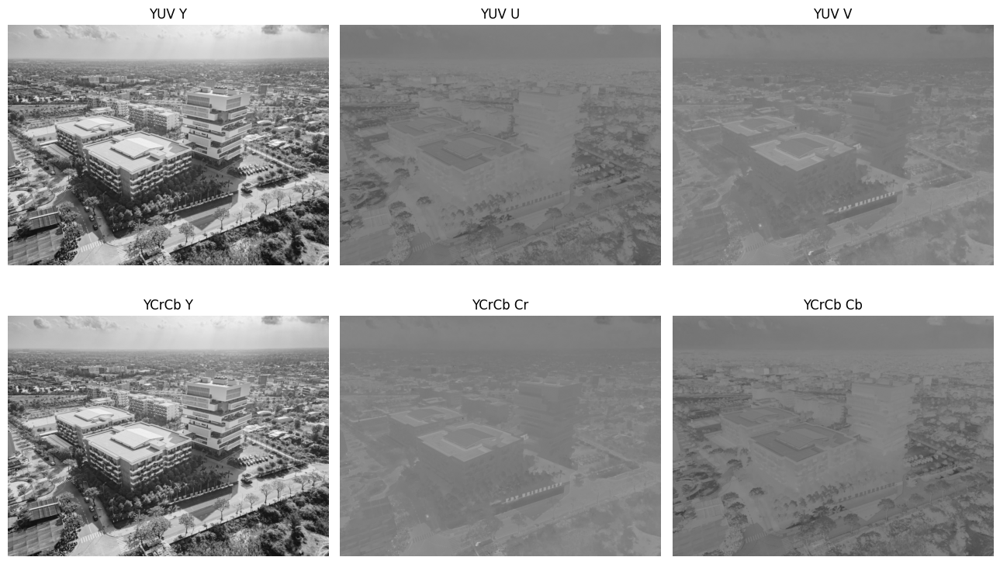

In [18]:
fig, axes = plt.subplots(2, 3, figsize=(13, 8))

channel_sets = [
    ("YUV", yuv, ["Y", "U", "V"]),
    ("YCrCb", ycrcb, ["Y", "Cr", "Cb"]),
]
for row, (space_name, arr, names) in enumerate(channel_sets):
    for col, name in enumerate(names):
        axes[row, col].imshow(arr[:, :, col], cmap="gray", vmin=0, vmax=255)
        axes[row, col].set_title(f"{space_name} {name}")
        axes[row, col].axis("off")
plt.tight_layout()
plt.show()

,mask,selected pixels,threshold/radius
0,Y bright/dark Otsu,319238,Otsu
1,YCrCb chroma target,42637,49.09
2,RGB channel target,44731,70.0


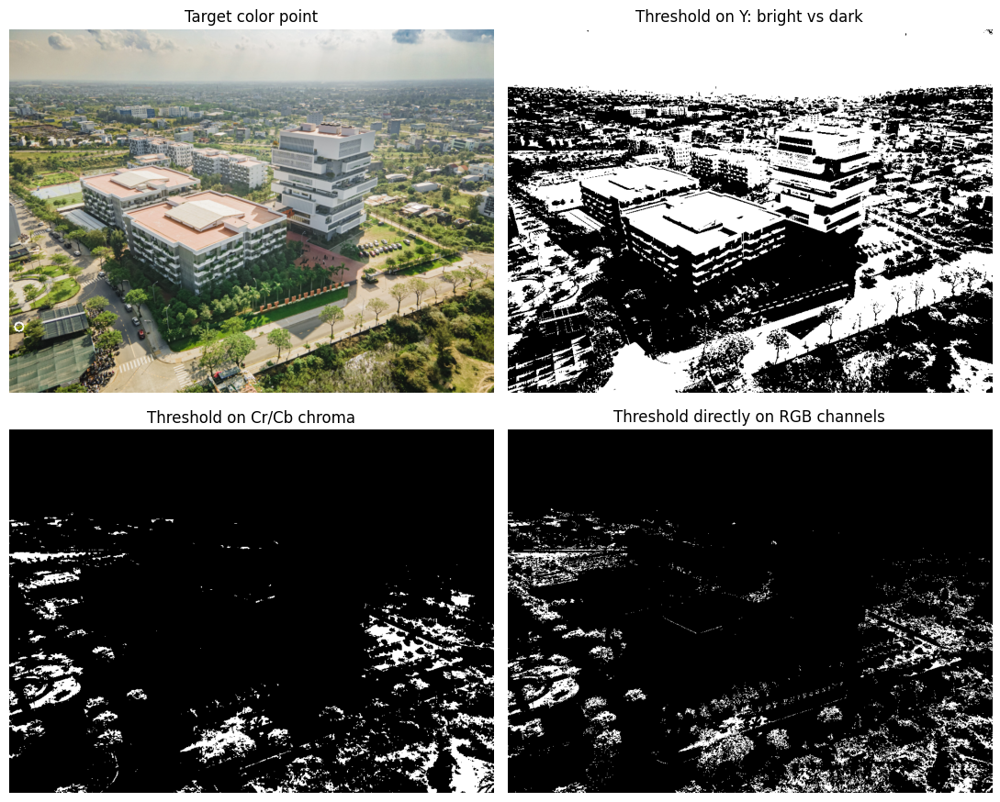

In [19]:
Y = ycrcb[:, :, 0]
_, bright_mask = cv2.threshold(Y, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

target_y, target_x = sample_points[0]
target_rgb = img_rgb[target_y, target_x].astype(np.int16)
target_chroma = ycrcb[target_y, target_x, 1:3].astype(np.float32)

chroma = ycrcb[:, :, 1:3].astype(np.float32)
chroma_distance = np.linalg.norm(chroma - target_chroma.reshape(1, 1, 2), axis=2)
chroma_radius = float(np.percentile(chroma_distance, 7))
chroma_mask = (chroma_distance <= chroma_radius).astype(np.uint8) * 255

rgb_abs_distance = np.max(np.abs(img_rgb.astype(np.int16) - target_rgb.reshape(1, 1, 3)), axis=2)
rgb_radius = float(np.percentile(rgb_abs_distance, 7))
rgb_mask = (rgb_abs_distance <= rgb_radius).astype(np.uint8) * 255

mask_summary = pd.DataFrame([
    {"mask": "Y bright/dark Otsu", "selected pixels": int(np.count_nonzero(bright_mask)), "threshold/radius": "Otsu"},
    {"mask": "YCrCb chroma target", "selected pixels": int(np.count_nonzero(chroma_mask)), "threshold/radius": round(chroma_radius, 2)},
    {"mask": "RGB channel target", "selected pixels": int(np.count_nonzero(rgb_mask)), "threshold/radius": round(rgb_radius, 2)},
])
display(mask_summary)

marked = img_rgb.copy()
cv2.circle(marked, (target_x, target_y), 8, (255, 255, 255), 2)

fig, axes = plt.subplots(2, 2, figsize=(11, 9))
axes[0, 0].imshow(marked)
axes[0, 0].set_title("Target color point")
axes[0, 1].imshow(bright_mask, cmap="gray")
axes[0, 1].set_title("Threshold on Y: bright vs dark")
axes[1, 0].imshow(chroma_mask, cmap="gray")
axes[1, 0].set_title("Threshold on Cr/Cb chroma")
axes[1, 1].imshow(rgb_mask, cmap="gray")
axes[1, 1].set_title("Threshold directly on RGB channels")
for ax in axes.ravel():
    ax.axis("off")
plt.tight_layout()
plt.show()

The Y threshold is intuitive for separating bright and dark regions because it ignores most chroma variation. The chroma mask is often more robust than direct RGB thresholding for finding similarly colored regions, because it focuses on color difference while reducing the effect of shading. RGB thresholding is simple, but it can reject the same material under different brightness or shadow.

## 13. Conclusion

RGB/BGR is convenient for storage and display, but many computer vision tasks become easier after separating color into more meaningful channels. HSV and HLS help isolate hue and saturation. YCrCb and YUV separate luma from chroma, which is useful in compression and segmentation. Lab and Luv are better for perceptual color difference than raw RGB. Opponent channels connect color processing to human vision, and Gray World white balancing shows a simple way to reduce illumination color casts.